#### Code derived from Style GAN github repo*

In [1]:
"""Minimal script for reproducing the figures of the StyleGAN paper using pre-trained generators."""

import os
import pickle
import numpy as np
import PIL.Image
import dnnlib
import dnnlib.tflib as tflib
import config
import matplotlib.pyplot as plt

#----------------------------------------------------------------------------
# Helpers for loading and using pre-trained generators.

url_ffhq        = 'https://drive.google.com/uc?id=1MEGjdvVpUsu1jB4zrXZN7Y4kBBOzizDQ' # karras2019stylegan-ffhq-1024x1024.pkl

In [2]:
synthesis_kwargs = dict(output_transform=dict(func=tflib.convert_images_to_uint8, nchw_to_nhwc=True), minibatch_size=8)

_Gs_cache = dict()

def load_Gs(url):
    if url not in _Gs_cache:
        with dnnlib.util.open_url(url, cache_dir=config.cache_dir) as f:
            _G, _D, Gs = pickle.load(f)
        _Gs_cache[url] = Gs
    return _Gs_cache[url]

In [3]:
tflib.init_tf()
Gs = load_Gs(url_ffhq)

In [4]:
src_latents = np.stack(np.random.RandomState(639).randn(Gs.input_shape[1]))
src_latents = src_latents.reshape(1, -1)

Interpolating intermediate latent inputs from -1 to 1

(10, 1024, 1024, 3)


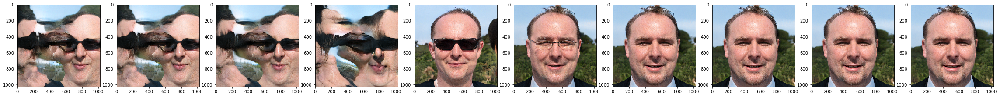

(10, 1024, 1024, 3)


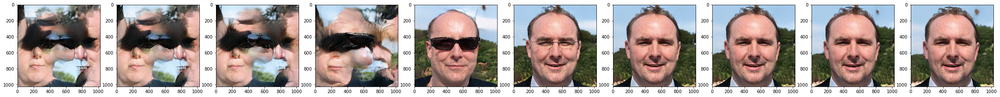

(10, 1024, 1024, 3)


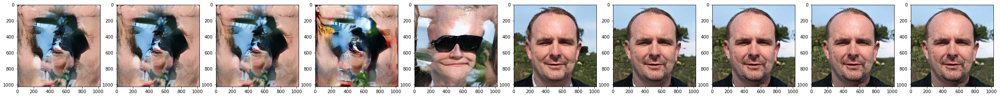

(10, 1024, 1024, 3)


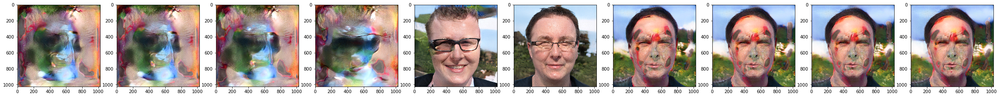

(10, 1024, 1024, 3)


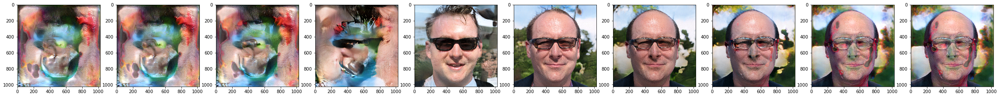

(10, 1024, 1024, 3)


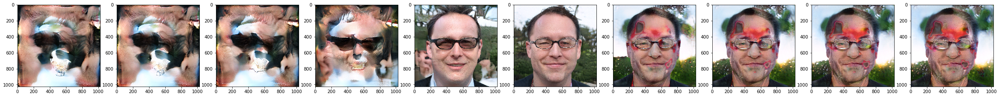

(10, 1024, 1024, 3)


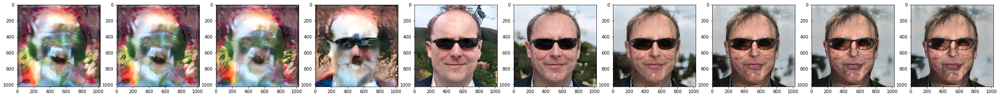

(10, 1024, 1024, 3)


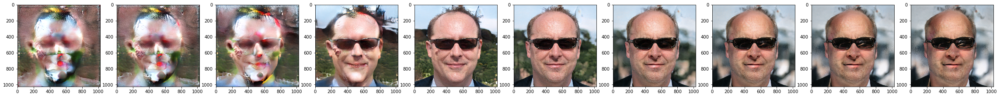

(10, 1024, 1024, 3)


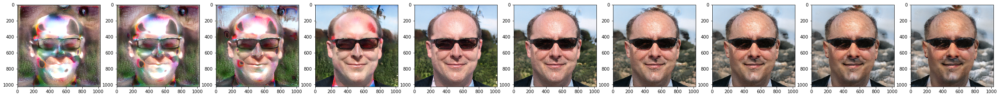

(10, 1024, 1024, 3)


In [ ]:
for i in range(10):
    lat_in = np.repeat(src_latents, 10, axis = 0)
    #print(lat_in.shape)
    #lat_in[:, i:i+20] = np.repeat(np.linspace(-1, 1, 10).reshape(1, -1), 20, axis = 0).T
    
    #lat_in[:, i] = np.linspace(-1, 1, 10)
    #print(lat_in.shape)
    
    # Generate image.
    latin_dlatents = Gs.components.mapping.run(lat_in, None) # [seed, layer, component]
    latin_dlatents[:, i, :] = np.repeat(np.linspace(-1, 1, 10).reshape(1, -1), 512, axis = 0).T
    #print(np.mean(latin_dlatents), np.std(latin_dlatents))
    #print(latin_dlatents.shape)
    images = Gs.components.synthesis.run(latin_dlatents, randomize_noise=False, **synthesis_kwargs)
    #print(images.shape)
    
    fig, ax= plt.subplots(nrows=1, ncols=10, figsize=(40, 4), squeeze = False)
    for j in range(10):
        ax[0, j].imshow(images[j])
    plt.show()